# Automated Feature Engineering using Automated Knowledge Graph

### Step # 1 Selection of Dataset  Blockchain and Problem Domain Price Prediction of BTC

#### Source of Data 

https://finance.yahoo.com/quote/BTC-USD/history?p=BTC-USD

In [1]:
import pandas as pd


In [2]:
data = pd.read_csv("BTC-USD.csv") 

In [3]:
data.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [4]:
data.tail(5)

,Date,Open,High,Low,Close,Adj Close,Volume
2436,2021-05-19,42944.976563,43546.117188,30681.496094,37002.441406,37002.441406,1.263581e+11
2437,2021-05-20,36753.667969,42462.984375,35050.617188,40782.738281,40782.738281,8.828194e+10
2438,2021-05-21,40596.949219,42172.171875,33616.453125,37304.691406,37304.691406,8.205162e+10
2439,2021-05-22,37371.031250,38831.054688,35383.683594,37536.632813,37536.632813,5.737727e+10
2440,2021-05-23,37026.246094,38265.753906,31227.339844,33877.511719,33877.511719,7.410413e+10


### Step # 2 Build Automated Knowledge graph with domain expert knowledge 

https://drzaighamabbas.github.io/AutomaticKnowledgegraph/

#### Selection of Datasource for Crawling Data

https://en.wikipedia.org/wiki/Open-high-low-close_chart

#### Build interactive Graph and Generate Dataset in JSON and TSV format

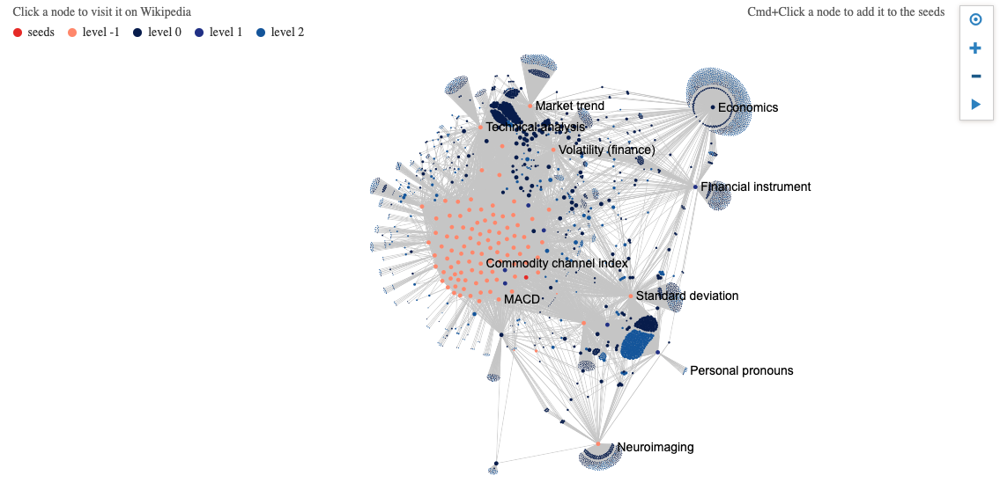

In [5]:
from IPython import display
display.Image("KG.png")

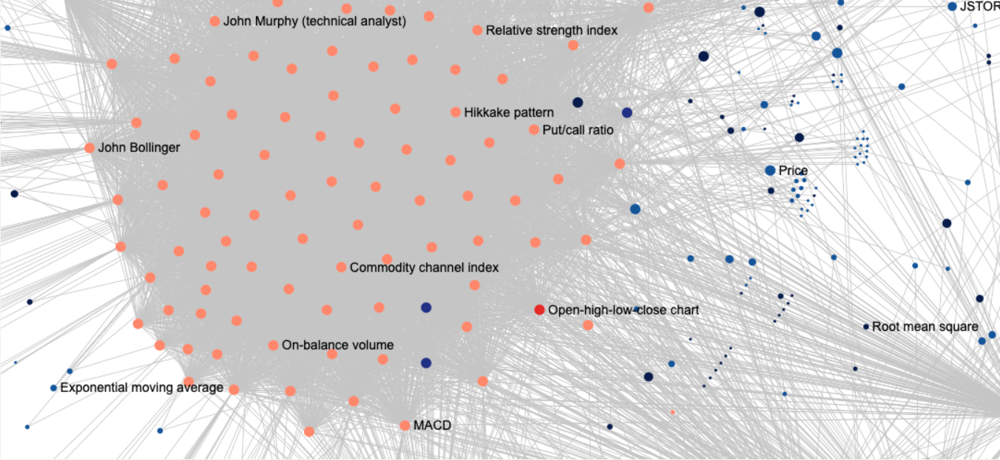

In [6]:
from IPython import display
display.Image("Features.png")

In [7]:
df = pd.read_csv("KG-DATA.tsv", sep = "\t")
df.head()

,source,target,depth
0,open-high-low-close chart,accumulation/distribution index,1
1,open-high-low-close chart,advance–decline line,1
2,open-high-low-close chart,average directional movement index,1
3,open-high-low-close chart,average true range,1
4,open-high-low-close chart,bollinger bands,1


In [8]:
df.tail(5)

,source,target,depth
15750,triple exponential moving average,wedge pattern,1
15751,double exponential moving average,wedge pattern,1
15752,zero lag exponential moving average,wedge pattern,1
15753,moving average envelope,wedge pattern,1
15754,volume analysis,wedge pattern,1


In [9]:
df.dtypes

source    object
target    object
depth      int64
dtype: object

In [10]:
df.shape

(15755, 3)

In [11]:
mask = df['source'] == 'open-high-low-close chart' 
  
# new dataframe with selected rows
df= pd.DataFrame(df[mask])
pd.set_option('display.max_rows', df.shape[0]+1)
  
df.head(96)

,source,target,depth
0,open-high-low-close chart,accumulation/distribution index,1
1,open-high-low-close chart,advance–decline line,1
2,open-high-low-close chart,average directional movement index,1
3,open-high-low-close chart,average true range,1
4,open-high-low-close chart,bollinger bands,1
5,open-high-low-close chart,bottom (technical analysis),1
6,open-high-low-close chart,breadth of market,1
7,open-high-low-close chart,breakout (technical analysis),1
8,open-high-low-close chart,broadening top,1
9,open-high-low-close chart,candlestick chart,1


In [5]:
#import libraries
import pandas as pd
import pandas_datareader.data as web
import datetime as dt

In [6]:
import pandas as pd
import datetime as dt
import yfinance as yf
import pandas_datareader.data as pdr
yf.pdr_override()
start = dt.datetime(2020, 5, 24)
end = dt.datetime(2021, 5, 23)


df = pdr.DataReader('BTC-USD',data_source='yahoo', start=start, end=end)

[*********************100%***********************]  1 of 1 completed


In [7]:
df.head(5)

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-05-23,9185.062500,9302.501953,9118.108398,9209.287109,9209.287109,27727866812
2020-05-24,9212.283203,9288.404297,8787.250977,8790.368164,8790.368164,32518803300
2020-05-25,8786.107422,8951.005859,8719.667969,8906.934570,8906.934570,31288157264
2020-05-26,8909.585938,8991.967773,8757.293945,8835.052734,8835.052734,29584186947
2020-05-27,8837.380859,9203.320312,8834.157227,9181.017578,9181.017578,32740536902


#### The data frame has the following columns:

Date: the day of reference. Each row represents one day.
High: the highest price of Bitcoin on the reference day.
Low: the lowest price of Bitcoin on the reference day.
Open: the open price of Bitcoin on the reference day.
Close: the closing price of Bitcoin on the reference day.
Volume: the volume of Bitcoin negotiated on the reference day.
Adj Close: the adjusted close price of Bitcoin on the reference day. 
Now that we have the data, let's move to the next part and plot our Candlestick chart.

### Plotting Bitcoin Candlesticks using Plotly

In [8]:
#import libraries
import plotly.offline as py
import plotly.graph_objs as go

In [9]:
#display the plot inside the notebook.
py.init_notebook_mode(connected=True)

In [10]:
data = [go.Candlestick(x=df.index,
                       open=df.Open,
                       high=df.High,
                       low=df.Low,
                       close=df.Close)]

layout = go.Layout(title='Bitcoin Candlestick with Range Slider',
                   xaxis={'rangeslider':{'visible':True}})

fig = go.Figure(data=data,layout=layout)

py.iplot(fig,filename='bitcoin_candlestick')


In [11]:
py.init_notebook_mode(connected=True)

data = [go.Candlestick(x=df.index,
                       open=df.Open,
                       high=df.High,
                       low=df.Low,
                       close=df.Close)]

layout = go.Layout(title='BTC Candlestick Range Slider and Selectors 1WEEK, 1MONTH, 3MONTHS , 6MONTHS and 1YEAR',
                  xaxis={'rangeselector':{'buttons':[{'count':7,
                                                      'label':'1W',
                                                      'step':'day',
                                                      'stepmode':'backward'},
                                                     {'count':1,
                                                      'label':'1M',
                                                      'step':'month',
                                                      'stepmode':'backward'},
                                                    {'count':3,
                                                      'label':'3M',
                                                      'step':'month',
                                                      'stepmode':'backward'},
                                                    {'count':6,
                                                      'label':'6M',
                                                      'step':'month',
                                                      'stepmode':'backward'},
                                                    {'count':1,
                                                      'label':'1Y',
                                                      'step':'year',
                                                      'stepmode':'backward'},
                                                      ]
                          },
                         'rangeslider':{'visible':True}})

fig = go.Figure(data=data,layout=layout)

py.iplot(fig,filename='bitcoin_candlestick_selector')

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.style.use('seaborn')

import ta

In [13]:
df = pd.read_csv("BTC-USD.csv")
df = ta.utils.dropna(df)

In [14]:
df.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0


In [15]:
df.shape

(2437, 7)

In [16]:
# Add all ta features filling nans values
df = ta.add_all_ta_features(df, "Open", "High", "Low", "Close","Volume", fillna=True)

/Users/Abbas/opt/anaconda3/lib/python3.7/site-packages/ta/trend.py:768: RuntimeWarning:

invalid value encountered in double_scalars

/Users/Abbas/opt/anaconda3/lib/python3.7/site-packages/ta/trend.py:772: RuntimeWarning:

invalid value encountered in double_scalars



In [17]:
df.shape

(2437, 90)

In [18]:
df.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_obv,volume_cmf,...,momentum_wr,momentum_ao,momentum_kama,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,others_dr,others_dlr,others_cr
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,21056800.0,-0.376331,...,-68.816572,0.0,457.334015,0.0,0.000000,0.000000,0.000000,-93.887388,0.000000,0.000000
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-13426400.0,-0.441847,...,-79.415296,0.0,430.775471,0.0,4.857081,0.971416,3.885665,-7.192558,-7.464335,-7.192558
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-51346100.0,-0.475969,...,-87.728680,0.0,402.091492,0.0,9.351817,2.647496,6.704321,-6.984264,-7.240151,-13.674475
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-14482500.0,-0.302148,...,-70.861553,0.0,406.896229,0.0,12.071627,4.532323,7.539305,3.573492,3.511124,-10.589639
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-41062600.0,-0.321074,...,-82.916476,0.0,401.353688,0.0,10.907564,5.807371,5.100193,-2.465855,-2.496766,-12.794369


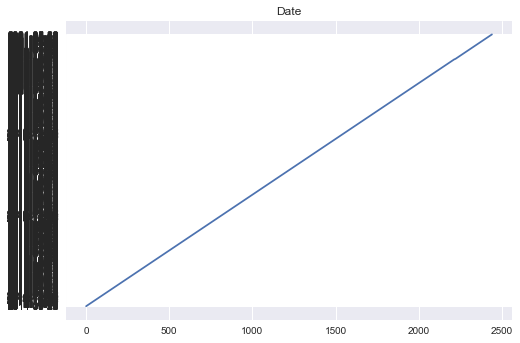

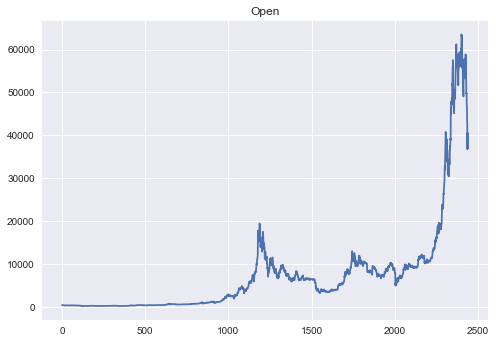

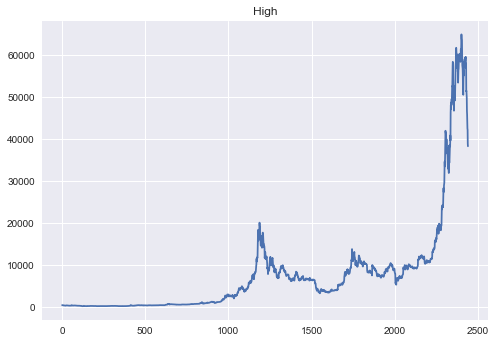

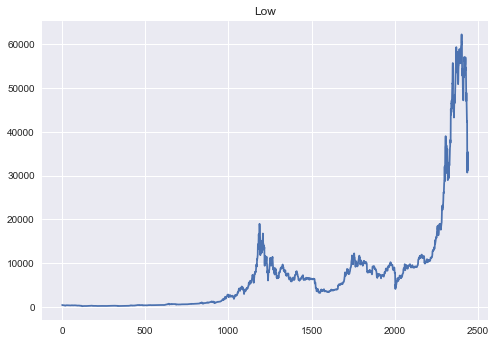

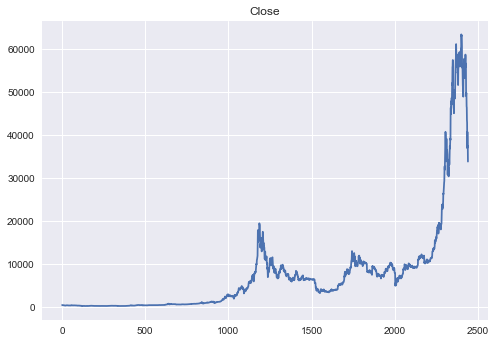

...

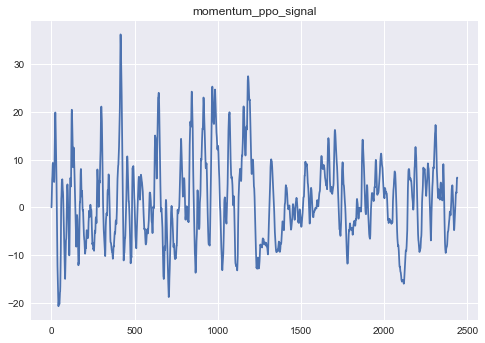

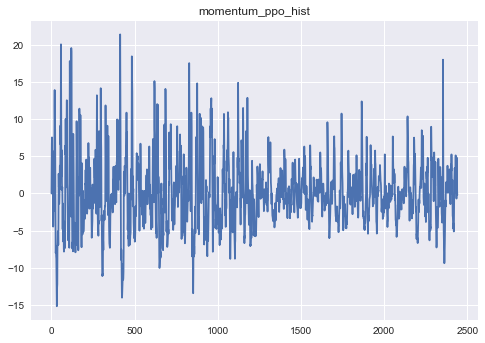

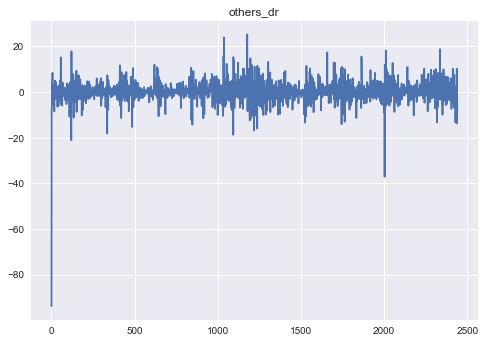

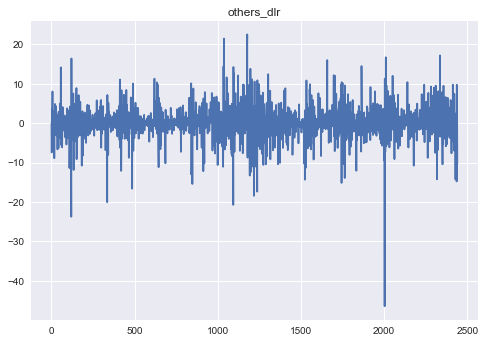

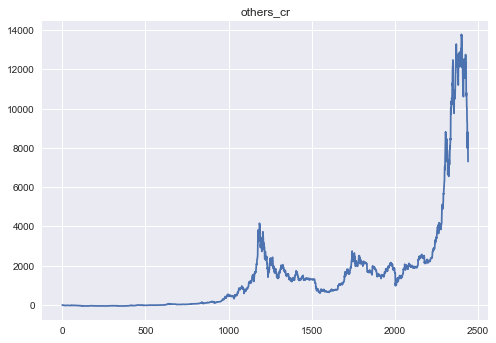

In [19]:
for col in df.columns:
    plt.plot(df[col])
    plt.title(col)
    plt.show()

In [20]:
df.to_csv("BTC-CMP-USD.csv",index = False)

In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as pl

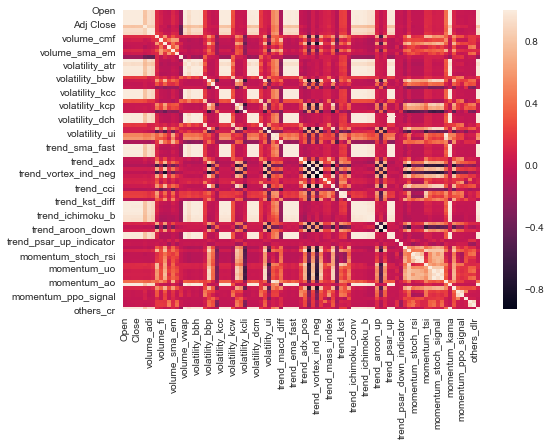

In [22]:
sns.heatmap(df.corr());

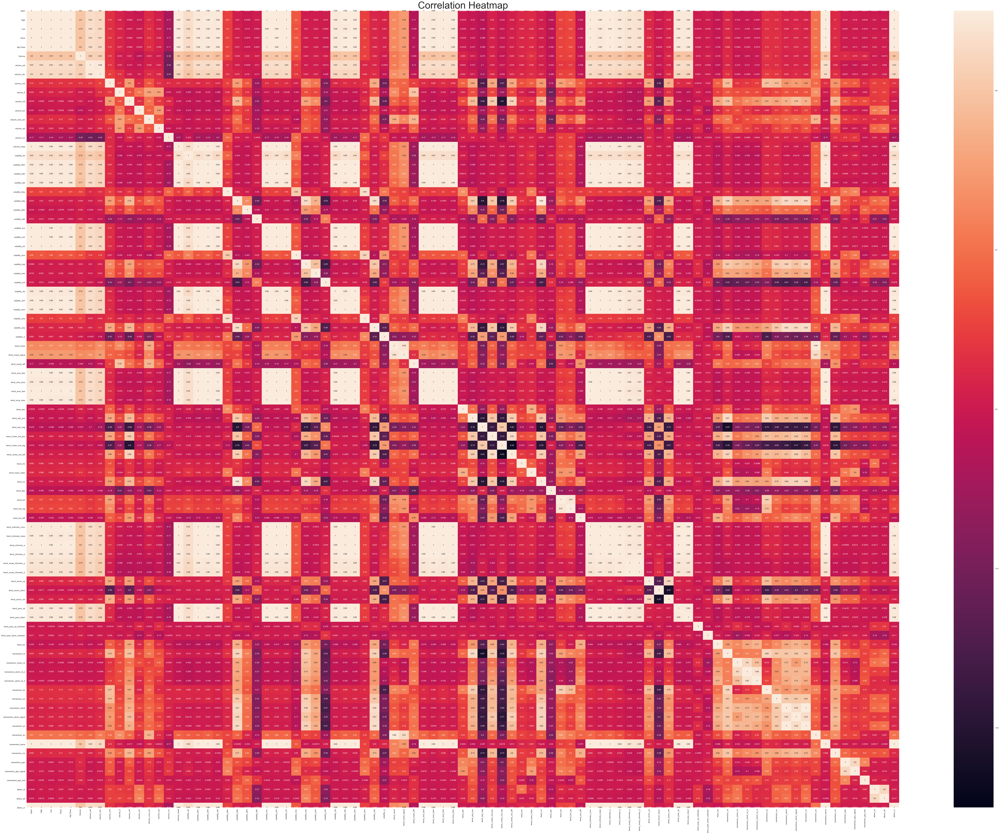

In [23]:
# Increase the size of the heatmap.
plt.figure(figsize=(100,75))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':50}, pad=12);

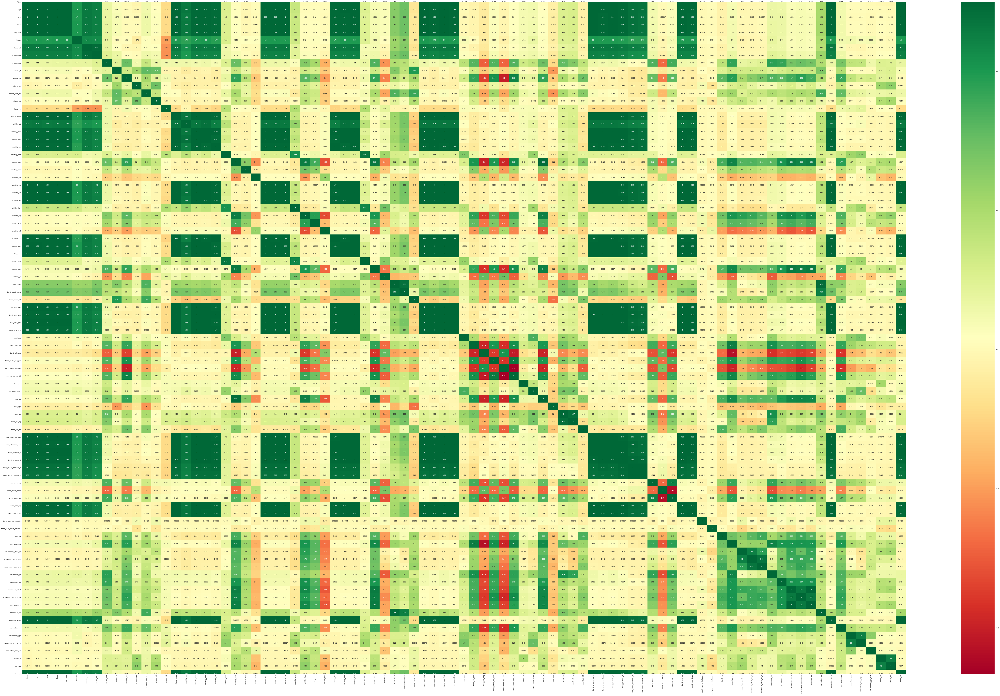

In [24]:
X = df.iloc[:,0:90]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(120,75))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [25]:

def get_feature_correlation(df, top_n=None, corr_method='pearson',
                            remove_duplicates=True, remove_self_correlations=True):
    """
    Compute the feature correlation and sort feature pairs based on their correlation

    :param df: The dataframe with the predictor variables
    :type df: pandas.core.frame.DataFrame
    :param top_n: Top N feature pairs to be reported (if None, all of the pairs will be returned)
    :param corr_method: Correlation compuation method
    :type corr_method: str
    :param remove_duplicates: Indicates whether duplicate features must be removed
    :type remove_duplicates: bool
    :param remove_self_correlations: Indicates whether self correlations will be removed
    :type remove_self_correlations: bool

    :return: pandas.core.frame.DataFrame
    """
    corr_matrix_abs = df.corr(method=corr_method).abs()
    corr_matrix_abs_us = corr_matrix_abs.unstack()
    sorted_correlated_features = corr_matrix_abs_us \
        .sort_values(kind="quicksort", ascending=False) \
        .reset_index()

    # Remove comparisons of the same feature
    if remove_self_correlations:
        sorted_correlated_features = sorted_correlated_features[
            (sorted_correlated_features.level_0 != sorted_correlated_features.level_1)
        ]

    # Remove duplicates
    if remove_duplicates:
        sorted_correlated_features = sorted_correlated_features.iloc[:-2:2]

    # Create meaningful names for the columns
    sorted_correlated_features.columns = ['Feature 1', 'Feature 2', 'Correlation (abs)']

    if top_n:
        return sorted_correlated_features[:top_n]

    return sorted_correlated_features

In [26]:
print("Top Absolute Correlations")
print(get_feature_correlation(df,50))


Top Absolute Correlations
               Feature 1            Feature 2  Correlation (abs)
0            momentum_wr       momentum_stoch           1.000000
60             Adj Close            others_cr           1.000000
63                 Close            others_cr           1.000000
95             others_cr                Close           1.000000
97        trend_sma_fast       volatility_kcc           0.999899
99           volume_vwap       trend_sma_fast           0.999835
101       trend_ema_fast       volatility_kcc           0.999768
103       trend_ema_fast       trend_sma_fast           0.999713
105  trend_ichimoku_conv       volatility_kcc           0.999653
107       volatility_kch       trend_sma_fast           0.999649
109       volatility_kch       volatility_kcc           0.999631
111     trend_ichimoku_a       trend_ema_fast           0.999614
113       trend_ema_fast  trend_ichimoku_conv           0.999575
115       volatility_kcc          volume_vwap           0.999568

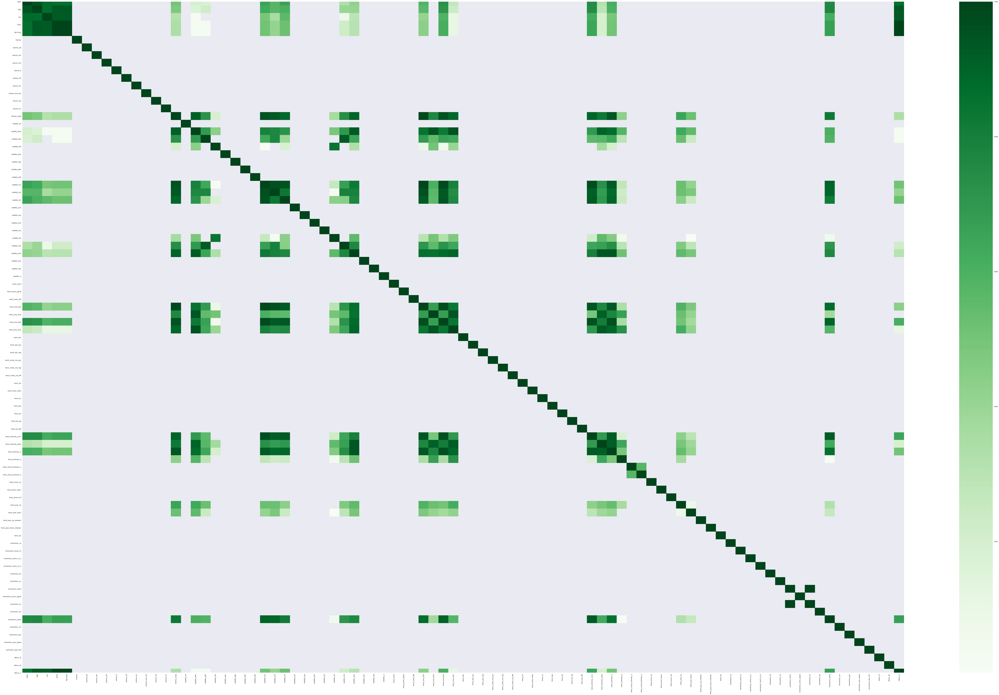

In [27]:
corr = df.corr()

kot = corr[corr>=.99]
plt.figure(figsize=(120,75))
sns.heatmap(kot, cmap="Greens")

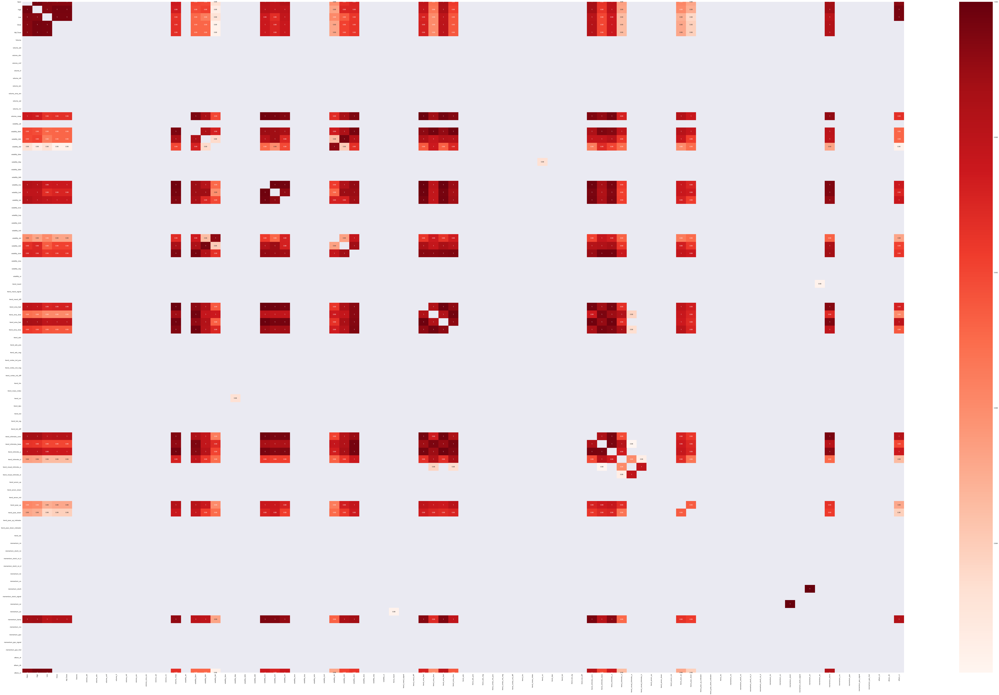

In [28]:
dfCorr = df.corr()
filteredDf = dfCorr[((dfCorr >= .98)) & (dfCorr !=1.000)]
plt.figure(figsize=(120,75))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
plt.show()

In [29]:
df = pd.DataFrame(df)
df=df.drop(['Date'], axis = 1)

In [30]:
df.head(5)

,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_obv,volume_cmf,volume_fi,...,momentum_wr,momentum_ao,momentum_kama,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,others_dr,others_dlr,others_cr
0,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,21056800.0,-0.376331,0.000000e+00,...,-68.816572,0.0,457.334015,0.0,0.000000,0.000000,0.000000,-93.887388,0.000000,0.000000
1,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-13426400.0,-0.441847,-1.134291e+09,...,-79.415296,0.0,430.775471,0.0,4.857081,0.971416,3.885665,-7.192558,-7.464335,-7.192558
2,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-51346100.0,-0.475969,-1.132834e+09,...,-87.728680,0.0,402.091492,0.0,9.351817,2.647496,6.704321,-6.984264,-7.240151,-13.674475
3,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-14482500.0,-0.302148,-8.967045e+08,...,-70.861553,0.0,406.896229,0.0,12.071627,4.532323,7.539305,3.573492,3.511124,-10.589639
4,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-41062600.0,-0.321074,-8.068905e+08,...,-82.916476,0.0,401.353688,0.0,10.907564,5.807371,5.100193,-2.465855,-2.496766,-12.794369


In [31]:
import numpy as np
from sklearn import preprocessing
from sklearn import utils
X = df.iloc[:,0:89]  #independent columns
y = df.iloc[:,-1]    #target column i.e price range
lab_enc = preprocessing.LabelEncoder()
training_scores_encoded = lab_enc.fit_transform(y)
print(training_scores_encoded)
print(utils.multiclass.type_of_target(y))
print(utils.multiclass.type_of_target(y.astype('int')))
print(utils.multiclass.type_of_target(training_scores_encoded))

[ 604  528  454 ... 2321 2324 2305]
continuous
multiclass
multiclass


[0.01214028 0.01288276 0.01225178 0.01208339 0.01224455 0.012108
 0.01240011 0.01248332 0.01205883 0.01199146 0.01230551 0.01245477
 0.01241686 0.01223934 0.01109726 0.0121804  0.01280753 0.01239588
 0.01244832 0.01208832 0.01245814 0.01248592 0.00182026 0.0012275
 0.01263201 0.01257184 0.01234604 0.01244853 0.01182858 0.00276736
 0.00245078 0.00855282 0.00887436 0.01006415 0.01224429 0.01210982
 0.01213673 0.01229722 0.01204831 0.01191466 0.01213387 0.01273938
 0.01244165 0.01217211 0.01267627 0.01236543 0.01245352 0.01203108
 0.01197676 0.01237371 0.01269468 0.01193245 0.01230554 0.01238754
 0.01240831 0.01250804 0.01202801 0.01096633 0.00995915 0.01169602
 0.00871195 0.01101513 0.00931072 0.0111336  0.01117675 0.01000097
 0.00974858 0.00949887 0.00197045 0.00182581 0.01181258 0.01227693
 0.01179065 0.01212637 0.01224479 0.0124511  0.01200423 0.01225421
 0.01217167 0.01242145 0.01253997 0.01193694 0.01268547 0.01220789
 0.01233259 0.01262293 0.01253381 0.01209257 0.01249319]


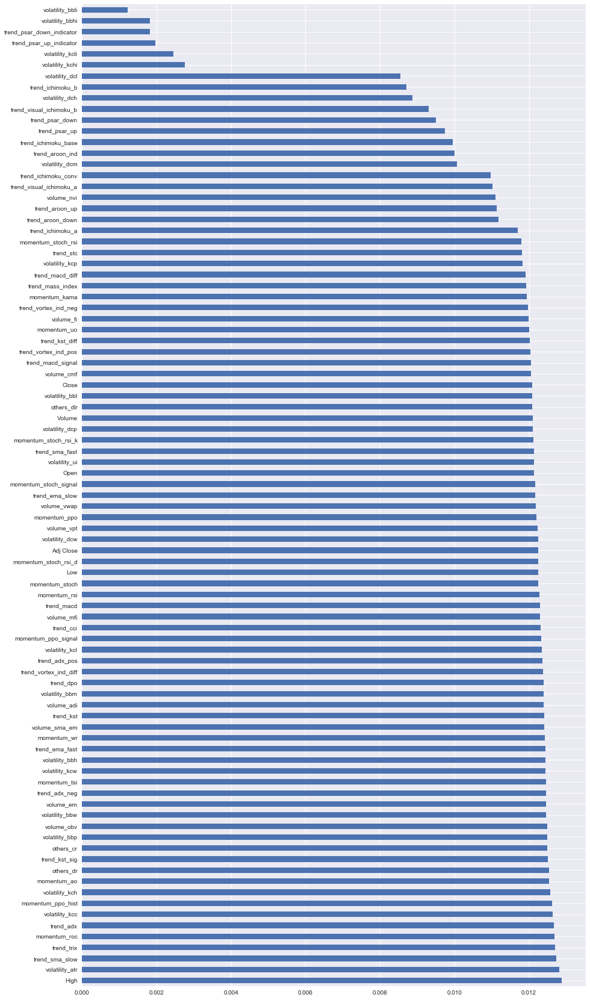

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesClassifier
fig = plt.figure(figsize=(15,30))
model = ExtraTreesClassifier()
model.fit(X,training_scores_encoded)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(1000).plot(kind='barh')
plt.show()


In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
fig = plt.figure(figsize=(15,30))
model = RandomForestClassifier(n_estimators=100)
model.fit(X,training_scores_encoded)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

<Figure size 1080x2160 with 0 Axes>

[0.01037165 0.0089793  0.00920512 0.00923203 0.00877059 0.01373383
 0.0112532  0.0114314  0.01616609 0.01230107 0.01610737 0.01371162
 0.01305775 0.0153064  0.01503679 0.00884349 0.01220592 0.00942776
 0.0098667  0.00993322 0.01439834 0.01322776 0.00104536 0.00047164
 0.00884122 0.0100295  0.00955133 0.01558558 0.01380437 0.00216202
 0.00133361 0.00726112 0.0070233  0.00838214 0.01455593 0.01331666
 0.01442842 0.01123604 0.01261715 0.01331467 0.00909808 0.00963713
 0.00894923 0.00908538 0.01540382 0.01312607 0.01403495 0.01332652
 0.0130704  0.0128169  0.01284295 0.01636799 0.01370675 0.01586106
 0.01264387 0.01415683 0.01518161 0.0082889  0.00859899 0.00841748
 0.00798864 0.01138942 0.00912695 0.00901034 0.00905016 0.010099
 0.00775289 0.00758555 0.00166518 0.00168332 0.01319533 0.01220522
 0.00978063 0.0129422  0.01506921 0.0129561  0.01549111 0.01218188
 0.01415046 0.01243716 0.01220662 0.00945466 0.0133396  0.01573136
 0.01585713 0.01641308 0.01479355 0.01440805 0.0098929 ]


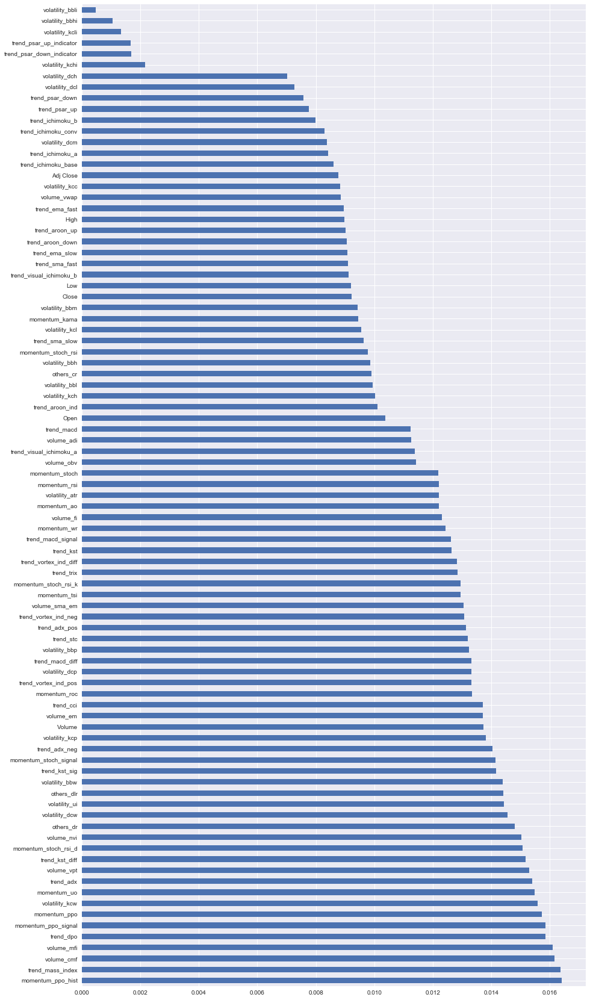

In [35]:
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
fig = plt.figure(figsize=(15,30))
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(1000).plot(kind='barh')
plt.show()

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import shapely
X_train, X_test, y_train, y_test = train_test_split(X,training_scores_encoded, test_size=0.25, random_state=12)

In [48]:
perm_importance = (model, X_test, y_test)

In [49]:
print(perm_importance)

(RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False),               Open          High           Low         Close     Adj Close  \
537     407.756989    415.916992    406.308990    414.321014    414.321014   
511     376.145996    385.483002    375.782990    381.648987    381.648987   
1971   9863.894531  10129.435547   9850.392578  10116.673828  10116.673828   
2191  10797.761719  11100.124023  10704.884766  10974.905273  10974.905273   
1907   7547.265625   7589.951660   7525.711426   7556.237793 

In [54]:
data = pd.read_csv("BTC-CMP-USD.csv") 

In [55]:
data.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_obv,volume_cmf,...,momentum_wr,momentum_ao,momentum_kama,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,others_dr,others_dlr,others_cr
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,21056800.0,-0.376331,...,-68.816572,0.0,457.334015,0.0,0.000000,0.000000,0.000000,-93.887388,0.000000,0.000000
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-13426400.0,-0.441847,...,-79.415296,0.0,430.775471,0.0,4.857081,0.971416,3.885665,-7.192558,-7.464335,-7.192558
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-51346100.0,-0.475969,...,-87.728680,0.0,402.091492,0.0,9.351817,2.647496,6.704321,-6.984264,-7.240151,-13.674475
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-14482500.0,-0.302148,...,-70.861553,0.0,406.896229,0.0,12.071627,4.532323,7.539305,3.573492,3.511124,-10.589639
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-41062600.0,-0.321074,...,-82.916476,0.0,401.353688,0.0,10.907564,5.807371,5.100193,-2.465855,-2.496766,-12.794369


In [56]:
data = pd.DataFrame(data)
data=data.drop(['Date'], axis = 1)

In [57]:
data.head(5)

,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_obv,volume_cmf,volume_fi,...,momentum_wr,momentum_ao,momentum_kama,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,others_dr,others_dlr,others_cr
0,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,21056800.0,-0.376331,0.000000e+00,...,-68.816572,0.0,457.334015,0.0,0.000000,0.000000,0.000000,-93.887388,0.000000,0.000000
1,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-13426400.0,-0.441847,-1.134291e+09,...,-79.415296,0.0,430.775471,0.0,4.857081,0.971416,3.885665,-7.192558,-7.464335,-7.192558
2,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-51346100.0,-0.475969,-1.132834e+09,...,-87.728680,0.0,402.091492,0.0,9.351817,2.647496,6.704321,-6.984264,-7.240151,-13.674475
3,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-14482500.0,-0.302148,-8.967045e+08,...,-70.861553,0.0,406.896229,0.0,12.071627,4.532323,7.539305,3.573492,3.511124,-10.589639
4,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-41062600.0,-0.321074,-8.068905e+08,...,-82.916476,0.0,401.353688,0.0,10.907564,5.807371,5.100193,-2.465855,-2.496766,-12.794369


In [58]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel

In [59]:
X = data.iloc[:,0:89]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range
print(X.shape, y.shape)

(2437, 89) (2437,)


In [60]:
import numpy as np
from sklearn import preprocessing
from sklearn import utils
lab_enc = preprocessing.LabelEncoder()
training_scores_encoded = lab_enc.fit_transform(y)
print(training_scores_encoded)
print(utils.multiclass.type_of_target(y))
print(utils.multiclass.type_of_target(y.astype('int')))
print(utils.multiclass.type_of_target(training_scores_encoded))

[ 604  528  454 ... 2321 2324 2305]
continuous
multiclass
multiclass


In [61]:
X_train, X_test, y_train, y_test = train_test_split(X,training_scores_encoded,test_size=0.25, random_state=12)

In [62]:
sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
sel.fit(X_train, y_train)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 max_samples=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100, n_jobs=None,
                                                 oob_score=False,

In [63]:
sel.get_support()

array([False, False, False, False, False,  True,  True, False,  True,
        True,  True,  True,  True,  True,  True, False,  True, False,
       False, False,  True,  True, False, False, False, False, False,
        True,  True, False, False, False, False, False,  True,  True,
        True,  True,  True,  True, False, False, False, False,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False,  True, False,
       False, False, False, False, False, False, False,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True,  True,  True,  True, False])

In [64]:
selected_feat= X_train.columns[(sel.get_support())]
len(selected_feat)

50

In [65]:
print(selected_feat)

Index(['Volume', 'volume_adi', 'volume_cmf', 'volume_fi', 'volume_mfi',
       'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_nvi',
       'volatility_atr', 'volatility_bbw', 'volatility_bbp', 'volatility_kcw',
       'volatility_kcp', 'volatility_dcw', 'volatility_dcp', 'volatility_ui',
       'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_adx',
       'trend_adx_pos', 'trend_adx_neg', 'trend_vortex_ind_pos',
       'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix',
       'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_diff', 'trend_visual_ichimoku_a',
       'trend_stc', 'momentum_rsi', 'momentum_stoch_rsi_k',
       'momentum_stoch_rsi_d', 'momentum_tsi', 'momentum_uo', 'momentum_stoch',
       'momentum_stoch_signal', 'momentum_wr', 'momentum_ao', 'momentum_roc',
       'momentum_ppo', 'momentum_ppo_signal', 'momentum_ppo_hist', 'others_dr',
       'others_dlr'],
      dtype='object')


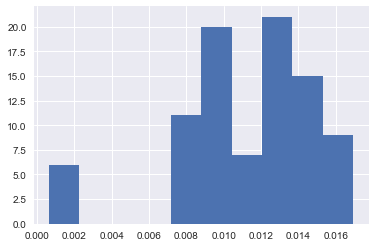

In [66]:
pd.Series(sel.estimator_.feature_importances_.ravel()).hist()

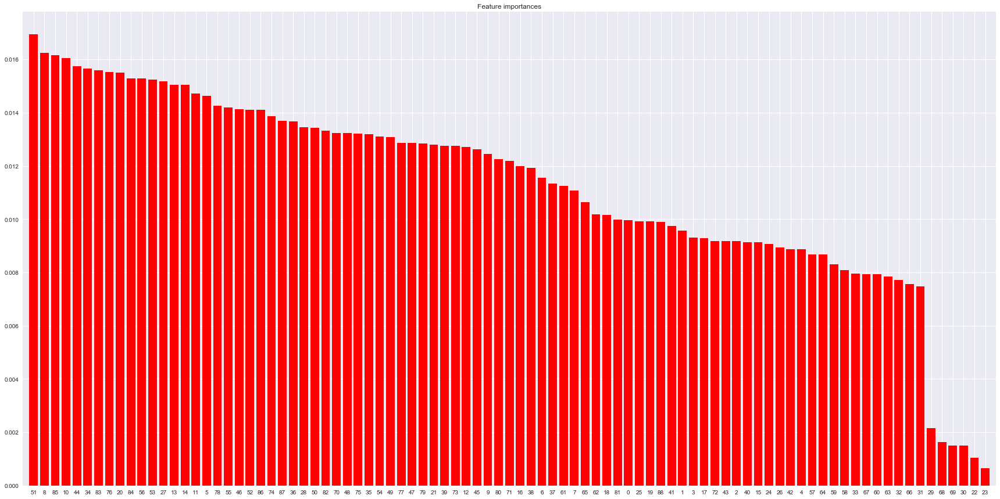

In [67]:
importances = sel.estimator_.feature_importances_
indices = np.argsort(importances)[::-1]
# X is the train data used to fit the model 
plt.figure(figsize=(30,15))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="r", align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()


In [68]:
print(selected_feat)

Index(['Volume', 'volume_adi', 'volume_cmf', 'volume_fi', 'volume_mfi',
       'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_nvi',
       'volatility_atr', 'volatility_bbw', 'volatility_bbp', 'volatility_kcw',
       'volatility_kcp', 'volatility_dcw', 'volatility_dcp', 'volatility_ui',
       'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_adx',
       'trend_adx_pos', 'trend_adx_neg', 'trend_vortex_ind_pos',
       'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix',
       'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_diff', 'trend_visual_ichimoku_a',
       'trend_stc', 'momentum_rsi', 'momentum_stoch_rsi_k',
       'momentum_stoch_rsi_d', 'momentum_tsi', 'momentum_uo', 'momentum_stoch',
       'momentum_stoch_signal', 'momentum_wr', 'momentum_ao', 'momentum_roc',
       'momentum_ppo', 'momentum_ppo_signal', 'momentum_ppo_hist', 'others_dr',
       'others_dlr'],
      dtype='object')


In [31]:
data = pd.read_csv("BTC-CMP-USD.csv") 
data.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_obv,volume_cmf,...,momentum_wr,momentum_ao,momentum_kama,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,others_dr,others_dlr,others_cr
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,21056800.0,-0.376331,...,-68.816572,0.0,457.334015,0.0,0.000000,0.000000,0.000000,-93.887388,0.000000,0.000000
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-13426400.0,-0.441847,...,-79.415296,0.0,430.775471,0.0,4.857081,0.971416,3.885665,-7.192558,-7.464335,-7.192558
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-51346100.0,-0.475969,...,-87.728680,0.0,402.091492,0.0,9.351817,2.647496,6.704321,-6.984264,-7.240151,-13.674475
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-14482500.0,-0.302148,...,-70.861553,0.0,406.896229,0.0,12.071627,4.532323,7.539305,3.573492,3.511124,-10.589639
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-41062600.0,-0.321074,...,-82.916476,0.0,401.353688,0.0,10.907564,5.807371,5.100193,-2.465855,-2.496766,-12.794369


In [32]:
data=data[['Date','Open','High','Low','Close','Adj Close','Volume', 'volume_adi', 'volume_cmf', 'volume_fi', 'volume_mfi',
       'volume_em', 'volume_sma_em', 'volume_vpt', 'volume_nvi',
       'volatility_atr', 'volatility_bbw', 'volatility_bbp', 'volatility_kcw',
       'volatility_kcp', 'volatility_dcw', 'volatility_dcp', 'volatility_ui',
       'trend_macd', 'trend_macd_signal', 'trend_macd_diff', 'trend_adx',
       'trend_adx_pos', 'trend_adx_neg', 'trend_vortex_ind_pos',
       'trend_vortex_ind_neg', 'trend_vortex_ind_diff', 'trend_trix',
       'trend_mass_index', 'trend_cci', 'trend_dpo', 'trend_kst',
       'trend_kst_sig', 'trend_kst_diff', 'trend_visual_ichimoku_a',
       'trend_stc', 'momentum_rsi', 'momentum_stoch_rsi_k',
       'momentum_stoch_rsi_d', 'momentum_tsi', 'momentum_uo', 'momentum_stoch',
       'momentum_stoch_signal', 'momentum_wr', 'momentum_ao', 'momentum_roc',
       'momentum_ppo', 'momentum_ppo_signal', 'momentum_ppo_hist']]
data=data.dropna()


In [33]:
data.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_cmf,volume_fi,...,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,-0.376331,0.000000e+00,...,0.000000,0.000000,31.183428,31.183428,-68.816572,0.0,0.0,0.000000,0.000000,0.000000
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-0.441847,-1.134291e+09,...,-100.000000,18.898992,20.584704,25.884066,-79.415296,0.0,0.0,4.857081,0.971416,3.885665
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-0.475969,-1.132834e+09,...,-100.000000,20.912983,12.271320,21.346484,-87.728680,0.0,0.0,9.351817,2.647496,6.704321
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-0.302148,-8.967045e+08,...,-99.049577,29.715849,29.138447,20.664824,-70.861553,0.0,0.0,12.071627,4.532323,7.539305
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-0.321074,-8.068905e+08,...,-98.285275,29.665318,17.083524,19.497764,-82.916476,0.0,0.0,10.907564,5.807371,5.100193


In [34]:
data.to_csv("KG-BTC-USD.csv",index=False) 

In [55]:
data = pd.read_csv("KG-BTC-USD.csv")

In [56]:
data.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_cmf,volume_fi,...,momentum_tsi,momentum_uo,momentum_stoch,momentum_stoch_signal,momentum_wr,momentum_ao,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,-0.376331,0.000000e+00,...,0.000000,0.000000,31.183428,31.183428,-68.816572,0.0,0.0,0.000000,0.000000,0.000000
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-0.441847,-1.134291e+09,...,-100.000000,18.898992,20.584704,25.884066,-79.415296,0.0,0.0,4.857081,0.971416,3.885665
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-0.475969,-1.132834e+09,...,-100.000000,20.912983,12.271320,21.346484,-87.728680,0.0,0.0,9.351817,2.647496,6.704321
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-0.302148,-8.967045e+08,...,-99.049577,29.715849,29.138447,20.664824,-70.861553,0.0,0.0,12.071627,4.532323,7.539305
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-0.321074,-8.068905e+08,...,-98.285275,29.665318,17.083524,19.497764,-82.916476,0.0,0.0,10.907564,5.807371,5.100193


In [57]:
import pandas as pd
from datetime import datetime
import numpy as np

df = pd.read_csv("KG-BTC-USD.csv",index_col='Date',parse_dates=['Date'])

df.dtypes

df['Year'] = df.index.year
df['Month'] =df.index.month
df['day'] =df.index.day
df['Weekday_Name'] =df.index.weekday_name
df['Day_of_Week'] =df.index.dayofweek

# monday = 0, sunday = 6

df['weekend'] = 0          # Initialize the column with default value of 0
df.loc[df['Day_of_Week'].isin([5, 6]), 'weekend'] = 1  # 5 and 6 correspond to Sat and Sun

df.head(500)

,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_cmf,volume_fi,volume_mfi,...,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,Year,Month,day,Weekday_Name,Day_of_Week,weekend
Date,,,,,,,,,,,,,,,,,,,,,
2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,-0.376331,0.000000e+00,50.000000,...,0.000000,0.000000,0.000000,0.000000,2014,9,17,Wednesday,2,0
2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-0.441847,-1.134291e+09,0.000000,...,0.000000,4.857081,0.971416,3.885665,2014,9,18,Thursday,3,0
2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-0.475969,-1.132834e+09,0.000000,...,0.000000,9.351817,2.647496,6.704321,2014,9,19,Friday,4,0
2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-0.302148,-8.967045e+08,33.257126,...,0.000000,12.071627,4.532323,7.539305,2014,9,20,Saturday,5,1
2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-0.321074,-8.068905e+08,26.899820,...,0.000000,10.907564,5.807371,5.100193,2014,9,21,Sunday,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-01-25,402.316986,402.316986,388.553986,391.726013,391.726013,59062400.0,5.109024e+08,-0.007600,-1.757700e+08,24.094634,...,-9.400489,1.427975,6.016501,-4.588526,2016,1,25,Monday,0,0
2016-01-26,392.002014,397.765991,390.575012,392.153015,392.153015,58147000.0,4.782752e+08,-0.029042,-1.471130e+08,25.565996,...,-8.866478,-0.163773,4.780446,-4.944220,2016,1,26,Tuesday,1,0
2016-01-27,392.444000,396.842987,391.782013,394.971985,394.971985,47424400.0,4.906347e+08,-0.077889,-1.069986e+08,33.796258,...,8.410207,-2.721174,3.280122,-6.001296,2016,1,27,Wednesday,2,0


In [58]:
df.to_csv('Bitcoin.csv')

In [59]:
df = pd.read_csv("Bitcoin.csv")

In [60]:
df.head(5)

,Date,Open,High,Low,Close,Adj Close,Volume,volume_adi,volume_cmf,volume_fi,...,momentum_roc,momentum_ppo,momentum_ppo_signal,momentum_ppo_hist,Year,Month,day,Weekday_Name,Day_of_Week,weekend
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800.0,-7.924336e+06,-0.376331,0.000000e+00,...,0.0,0.000000,0.000000,0.000000,2014,9,17,Wednesday,2,0
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200.0,-2.454020e+07,-0.441847,-1.134291e+09,...,0.0,4.857081,0.971416,3.885665,2014,9,18,Thursday,3,0
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700.0,-4.448391e+07,-0.475969,-1.132834e+09,...,0.0,9.351817,2.647496,6.704321,2014,9,19,Friday,4,0
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600.0,-3.937687e+07,-0.302148,-8.967045e+08,...,0.0,12.071627,4.532323,7.539305,2014,9,20,Saturday,5,1
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100.0,-5.037763e+07,-0.321074,-8.068905e+08,...,0.0,10.907564,5.807371,5.100193,2014,9,21,Sunday,6,1
